In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import math
import os
import random
from pandas_datareader import data as wb
import matplotlib.pyplot as plt

import yfinance as yf
import datetime as dt

In [2]:
def period(start, end, distance = 1):
    s = start.split('-')
    e = end.split('-')
    y1 = int(s[0])
    m1 = int(s[1])
    d1 = int(s[2])
    y2 = int(e[0])
    m2 = int(e[1])
    d2 = int(e[2])
    dates = []
    dates.append(start)
    while((y1 < y2) or (y1 == y2 and m1 < m2) or (y1 == y2 and m1 == m2 and d1 <= d2 - distance)):
        if(np.isin(m1, [1,3,5,7,8,10])):
            d1 += distance
            if(d1 > 31):
                d1 = d1%31
                m1 += 1
        elif(m1 == 12):
            d1 += distance
            if(d1 > 31):
                d1 = d1%31
                m1 = 1
                y1 += 1
        elif(np.isin(m1, [4,6,9,11])):
            d1 += distance
            if(d1 > 30):
                d1 = d1%30
                m1 += 1
        elif(m1 == 2):
            d1 += distance
            if((y1/4 - math.floor(y1/4)) == 0):
                if(d1 > 29):
                    d1 = d1%29
                    m1 += 1
            else:
                if(d1 > 28):
                    d1 = d1%28
                    m1 += 1
        else:
            print("Error: month > 12")
        dates.append(str(y1)+'-'+str(m1)+'-'+str(d1))
        df = pd.DataFrame(dates,columns=['Date'])
        df['Date'] =  pd.to_datetime(df['Date'], format='%Y-%m-%d')
        df = df.set_index(['Date'])
        #df = pd.to_datetime(df)
    return df
def month_list(start_date,end_date):
    start_d = start_date.split('-')[2]
    start_m = start_date.split('-')[1]
    start_y = start_date.split('-')[0]
    end_d = end_date.split('-')[2]
    end_m = end_date.split('-')[1]
    end_y = end_date.split('-')[0]
    n_months = ((int(end_y) - int(start_y))*12) + ((int(end_m) - int(start_m)))
    months = []
    y = int(start_y)
    for i in range(n_months):
        m = ((int(start_m) - 1 + i)%12) + 1
        if(((int(start_m)-1 + i)%12) == 0 and i != 0):
            y += 1 
        date = str(y) + '-' + str(m) + '-' + str(1)
        months.append(date)
    months = pd.DataFrame(months, columns=['Date'])
    months['Date'] =  pd.to_datetime(months['Date'], format='%Y-%m-%d')
    months = months.set_index(['Date'])
    return months

def load_table(path, dvd = True):
    files = os.listdir(path)
    df_list = list()
    for i in range(len(files)):
        table = pd.read_csv(path+files[i],index_col='Date',parse_dates=True)[['Close']]
        name = files[i].replace(".csv","")
        table.columns = [name]
        df_list.append(table)
    df = df_list[0]
    for df_ in df_list[1:]:
        df = pd.concat([df,df_], axis=1)
    df.fillna(method='ffill',inplace=True)
    return df_list, df

def monthly_returns(price, start_date, end_date):
    months = month_list(start_date,end_date)
    returns_df = pd.DataFrame(months.index,columns=['Date'])
    for col in price.columns:
        values = []
        for i in range(len(months)-1):
            idx = price.loc[(price.index >= months.index[i]) & (price.index < months.index[i+1])].index
            v = price.loc[idx,col].iloc[0]
            values = np.append(values,v)
            values = pd.DataFrame(values,columns=[col])
        returns_df = pd.concat([returns_df,values],axis=1)
    returns_df.drop(len(months)-1,axis=0,inplace=True)
    returns_df = returns_df.set_index("Date")
    returns = returns_df.pct_change()*100
    returns = returns.drop(returns.index[0], axis=0)
    return returns_df

def tree_to_table(tree, name_str):
    n_gen = len(tree)
    n_chrom = len(tree[0])
    name = []
    gen = []
    chrom = []
    ret = []
    vol = []
    sr = []
    res = []
    for i in range(n_gen):
        for j in range(n_chrom):
            name.append(name_str)
            gen.append(i)
            chrom.append(j)
            ret.append(tree[i][j].get_expected_return())
            vol.append(tree[i][j].get_volatility())
            sr.append(tree[i][j].get_sharpe_ratio())
    d = {'name': name, 'generation': gen, 'chromosome': chrom, 'return': ret, 'volatility': vol, 'sharpe_ratio': sr}
    df = pd.DataFrame(data=d)
    return df

In [3]:
class Portfolio:
    def __init__(self, returns_df, corr_matrix, risk_free):
        self.returns = returns_df
        self.corr = corr_matrix
        self.description = self.returns.describe()
        self.n_assets = self.returns.shape[1]
        self.risk_free = risk_free
        self.initialize_weights()
        self.set_expected_return()
        self.set_volatility()
        self.set_sharpe_ratio()
        return None
    def initialize_weights(self):
        self.weights = np.random.rand(self.n_assets)
        self.weights = (self.weights/self.weights.sum())
        return None
    def set_weights(self, weights):
        self.weights = (weights/weights.sum())
        self.set_discrete_weights = self.weights
        return None
    def set_expected_return(self):
        weighted = self.weights*self.description.loc['mean']
        self.expected_return = weighted.sum().round(2)
        return None
    def set_volatility(self):
        std = self.description.loc['std'].values
        m1 = (self.weights*std).reshape(self.n_assets,1)
        m2 = m1.reshape(1,self.n_assets)
        self.volatility = math.sqrt((m1*self.corr*m2).sum())
        return None
    def set_sharpe_ratio(self):
        self.sharpe_ratio = (self.expected_return-self.risk_free)/self.volatility
        return None
    def get_weights(self):
        return self.weights
    def get_expected_return(self):
        return self.expected_return
    def get_volatility(self):
        return self.volatility
    def get_sharpe_ratio(self):
        return self.sharpe_ratio

In [4]:
class Genetic_algorithm:
    def __init__(self, returns_df, corr_matrix, risk_free, size):
        self.returns = returns_df
        self.corr = corr_matrix
        self.risk_free = risk_free
        self.size = size
        return None
    def run(self, iterations, variable):
        self.initialize()
        for i in range(iterations):
            self.set_fitness(variable)
            self.select_fittest()
            self.crossover()
            self.mutation()
            self.pass_generation(variable)
        return None
    def initialize(self):
        self.population = []
        self.offspring = []
        self.population_best = []
        self.population_fitness = []
        self.population_mean  = []
        self.tree = list()
        for i in range(self.size):
            self.population.append(Portfolio(self.returns, self.corr, self.risk_free))
        self.population_df = self.to_table(self.population)
        self.tree.append(self.population)
        return None
    def set_fitness(self, variable):
        if(variable == 'volatility'):
            max_volatility = self.population_df[variable].max()
            self.population_df.sort_values(by=variable, inplace=True, ascending=True)
            self.population_df['fitness'] = max_volatility - self.population_df[variable] + 1
            self.population_df['fitness'] = self.population_df['fitness']/self.population_df['fitness'].sum()
        else:
            self.population_df.sort_values(by=variable, inplace=True, ascending=False)
            self.population_df['fitness'] = self.population_df[variable]/self.population_df[variable].sum()
        self.population_df['selection_prob'] = self.population_df['fitness']
        for i in range(1, len(self.population_df['selection_prob'])):
            self.population_df['selection_prob'].iloc[i] = self.population_df['selection_prob'].iloc[i-1] + self.population_df['selection_prob'].iloc[i]
        return self.population_df
    def select_fittest(self, rand = True):
        third = int(self.size/3)
        idx = self.population_df.head(third).index.values
        if(rand == True):
            for i in idx:
                self.offspring.append(self.population[i])
                p = Portfolio(self.returns, self.corr, self.risk_free)
                self.offspring.append(p)
        else:
            for i in idx:
                self.offspring.append(self.population[i])
        return None
    def crossover(self):
        rest = self.size - len(self.offspring)
        for i in range(rest):
            idx_parent1 = self.select_parent()
            idx_parent2 = self.select_parent()
            alpha = random.random()
            w3 = alpha*self.population[idx_parent1].get_weights() + (1-alpha)*self.population[idx_parent2].get_weights()
            p = Portfolio(self.returns, self.corr, self.risk_free)
            p.set_weights(w3)
            self.offspring.append(p)
        return None
    def mutation(self):
        n_assets = len(self.population[0].get_weights())
        for child in self.offspring:
            idx1 = random.randrange(0,n_assets)
            idx2 = random.randrange(0,n_assets)
            w = child.get_weights()
            minimo = min(w[idx1],w[idx2])
            rand = random.uniform(0,minimo)
            w[idx1] += rand
            w[idx2] -= rand
            child.set_weights(w)
        return None
    def pass_generation(self, variable):
        self.population = self.offspring
        self.offspring = []
        self.population_df = self.to_table(self.population)
        self.tree.append(self.population)
        best = self.population[0]
        mean_fit = self.population_df[variable].mean()
        if(variable == 'volatility'):
            max_fit = self.population_df.sort_values(by=variable, ascending=True).head(1)[variable].iloc[0]
        else:
            max_fit = self.population_df.sort_values(by=variable, ascending=False).head(1)[variable].iloc[0]
        self.population_best.append(best)
        self.population_fitness.append(max_fit)
        self.population_mean.append(mean_fit)
        return None
    def select_parent(self):
        roulette = random.random()
        i = 0
        while roulette > self.population_df['selection_prob'].iloc[i]: 
            i += 1
        if(i > 0):
            i = i - 1
        return self.population_df.iloc[i,:].name
    def to_table(self, array):
        exp_returns = [s.get_expected_return() for s in array]
        volatilities = [s.get_volatility() for s in array]
        sharpe_ratios = [s.get_sharpe_ratio() for s in array]
        d = {'return': exp_returns, 'volatility': volatilities, 'sharpe_ratio' : sharpe_ratios}
        df = pd.DataFrame(data=d) 
        return df
    def get_samples(self):
        return self.samples
    def get_population(self,variable):
        self.population_df.sort_values(by=variable, inplace=True, ascending=False)
        idx = self.population_df.head(1).index.values[0]
        return self.population[idx]
    def get_tree(self, variable):
        return self.tree
    def get_analysis(self):
        d = {'best_fitness':self.population_fitness,'fitness_mean':self.population_mean}
        output = pd.DataFrame(data=d) 
        return output

# Load data

In [5]:
stock_names = ['AAPL', 'TSLA','DIS','LLY', 'NVDA','MSFT','META', 'AMZN', 'GOOGL', 'JPM','COST']

In [6]:
# Getting daily returns for 11 different US stocks in the same time window 
start_date = '2017-07-01'
end_date = '2024-08-22'
aapl_df = yf.download('AAPL', start = '2017-07-01', end = end_date)
tsla_df = yf.download('TSLA', start = '2017-07-01', end = end_date)
dis_df = yf.download('DIS', start = '2017-07-01', end = end_date)
lly_df = yf.download('LLY', start = '2017-07-01', end = end_date)
nvda_df = yf.download('NVDA', start = '2017-07-01', end = end_date)
msft_df = yf.download('MSFT', start = '2017-07-01', end = end_date)
meta_df = yf.download('META', start = '2017-07-01', end = end_date)
amzn_df = yf.download('AMZN', start = '2017-07-01', end = end_date)
googl_df = yf.download('GOOGL', start = '2017-07-01', end = end_date)
jpm_df = yf.download('JPM', start = '2017-07-01', end = end_date)
costco_df = yf.download('COST', start = '2017-07-01', end = end_date)

risk_free = 0

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [7]:
# Extracting Adjusted Close for each stock
aapl_df = aapl_df['Adj Close']
tsla_df = tsla_df['Adj Close']
dis_df = dis_df['Adj Close']
lly_df = lly_df['Adj Close']
nvda_df = nvda_df['Adj Close']
msft_df = msft_df['Adj Close']
meta_df = meta_df['Adj Close']
amzn_df = amzn_df['Adj Close']
googl_df = googl_df['Adj Close']
jpm_df = jpm_df['Adj Close']
costco_df = costco_df['Adj Close']

# Merging and creating an Adj Close dataframe for stocks
df = pd.concat([aapl_df, tsla_df, dis_df, lly_df, nvda_df, msft_df, meta_df, amzn_df, googl_df, jpm_df, costco_df], join = 'outer', axis = 1)
df.columns = ['aapl', 'tsla', 'dis', 'lly', 'nvda', 'msft', 'meta', 'amzn', 'googl', 'jpm', 'costco']
df.head()

,aapl,tsla,dis,lly,nvda,msft,meta,amzn,googl,jpm,costco
Date,,,,,,,,,,,
2017-07-03,33.542892,23.507999,102.100540,73.133392,3.440710,62.636627,148.125610,47.682999,45.920296,76.117058,142.351044
2017-07-05,33.680790,21.806000,100.361809,73.133392,3.532574,63.472767,150.031693,48.570000,46.559563,76.880280,141.634018
2017-07-06,33.362907,20.588667,98.926018,72.160629,3.543193,63.004147,148.514816,48.257000,46.331326,76.634071,140.800446
2017-07-07,33.701839,20.881332,98.897293,72.770790,3.624192,63.821918,151.129440,48.938000,46.986576,77.019783,138.129456
2017-07-10,33.907539,21.070000,99.155731,72.761963,3.795573,64.299721,153.185211,49.823502,47.495487,76.478142,135.341980


In [8]:
daily = period(start_date, end_date, distance=1)
stock_price = pd.merge(daily, df, on='Date', how='left')
stock_price.fillna(method='ffill',inplace=True)
months = month_list(start_date,end_date)
monthly_price = pd.merge(months, stock_price, on='Date', how='left')
monthly_returns = monthly_price.pct_change()*100
monthly_returns = monthly_returns.drop(monthly_returns.index[0], axis=0)
corr = monthly_returns.corr()
corr_matrix = corr.values

/var/folders/lk/kw42wvys5h52nhtn0k0xbt8w0000gn/T/ipykernel_69001/404301339.py:3: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  stock_price.fillna(method='ffill',inplace=True)


In [9]:
monthly_returns.head()

,aapl,tsla,dis,lly,nvda,msft,meta,amzn,googl,jpm,costco
Date,,,,,,,,,,,
2017-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01,9.759546,11.211939,-8.236145,-2.160087,3.720655,2.416572,1.271640,-1.800868,0.573660,-1.429649,-0.609828
2017-10-01,-6.053029,-4.023634,-2.886701,6.818230,4.875040,0.743869,-0.668528,-1.727570,2.282587,4.154840,3.823269
2017-11-01,8.285731,-5.869249,0.466664,-3.097986,15.903113,11.665964,6.899983,14.805215,7.073902,6.282013,-0.973838
2017-12-01,2.861151,-4.531578,6.280928,3.581628,-4.528295,1.807123,-4.138836,5.315857,-1.681368,3.834742,14.130729


(11.5, -0.5)

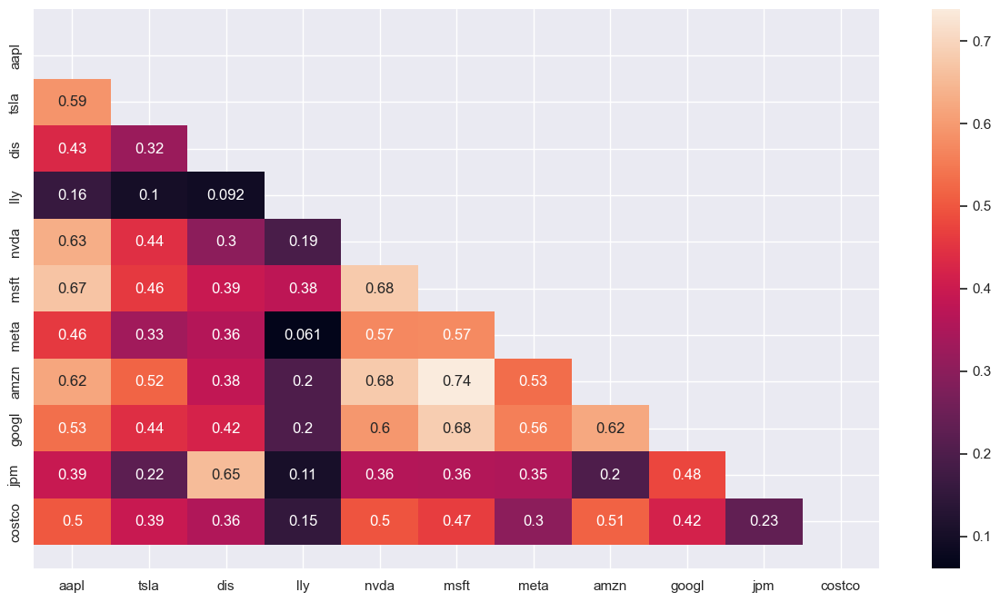

In [10]:
sns.set()
plt.figure(figsize=(15,8))
mask = np.triu(np.ones_like(corr, dtype=bool))
ax = sns.heatmap(data=corr, annot=True, mask=mask)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

# Genetic algorithm setting

In [11]:
population_size = 50
n_generations = 100
GA = Genetic_algorithm(monthly_returns, corr_matrix, risk_free, population_size)

In [12]:
variable = 'return'
GA.run(n_generations,variable)
tree1 = GA.get_tree(variable)
analysis1 = GA.get_analysis()
variable = 'volatility'
GA.run(n_generations,variable)
tree2 = GA.get_tree(variable)
analysis2 = GA.get_analysis()
variable = 'sharpe_ratio'
GA.run(n_generations,variable)
tree3 = GA.get_tree(variable)
analysis3 = GA.get_analysis()

/var/folders/lk/kw42wvys5h52nhtn0k0xbt8w0000gn/T/ipykernel_69001/1431446132.py:40: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  self.population_df['selection_prob'].iloc[i] = self.population_df['selection_prob'].iloc[i-1] + self.population_

In [13]:
result1_df = tree_to_table(tree1, 'tree_1')
result2_df = tree_to_table(tree2, 'tree_2')
result3_df = tree_to_table(tree3, 'tree_3')
results_df = pd.concat([result1_df, result2_df, result3_df])

In [14]:
results_df.sort_values(by = ['return','volatility'], inplace=True, ascending=[False,True])
b1 = results_df.head(1)
results_df

,name,generation,chromosome,return,volatility,sharpe_ratio
251,tree_3,5,1,3.54,9.537269,0.371175
213,tree_3,4,13,3.52,9.187049,0.383148
3459,tree_1,69,9,3.49,9.121109,0.382629
3500,tree_1,70,0,3.49,9.121109,0.382629
3550,tree_1,71,0,3.49,9.121109,0.382629
...,...,...,...,...,...,...
4739,tree_3,94,39,1.81,6.287481,0.287874
759,tree_2,15,9,1.81,7.162773,0.252695
3077,tree_1,61,27,1.78,5.867690,0.303356
3735,tree_1,74,35,1.77,6.506140,0.272051


In [15]:
results_df.sort_values(by = ['volatility','return'], inplace=True, ascending=[True,False])
b2 = results_df.head(1)
results_df

,name,generation,chromosome,return,volatility,sharpe_ratio
1687,tree_2,33,37,2.50,4.989968,0.501005
1700,tree_2,34,0,2.50,4.989968,0.501005
1750,tree_2,35,0,2.50,4.989968,0.501005
1800,tree_2,36,0,2.50,4.989968,0.501005
1850,tree_2,37,0,2.50,4.989968,0.501005
...,...,...,...,...,...,...
251,tree_3,5,1,3.54,9.537269,0.371175
4897,tree_2,97,47,2.89,9.538477,0.302983
2709,tree_3,54,9,2.82,9.579036,0.294393
829,tree_3,16,29,3.23,9.589139,0.336839


In [16]:
results_df.sort_values(by='sharpe_ratio', inplace=True, ascending=False)
b3 = results_df.head(1)
results_df

,name,generation,chromosome,return,volatility,sharpe_ratio
1236,tree_1,24,36,2.85,5.504768,0.517733
1687,tree_2,33,37,2.50,4.989968,0.501005
3850,tree_2,77,0,2.50,4.989968,0.501005
4150,tree_2,83,0,2.50,4.989968,0.501005
4100,tree_2,82,0,2.50,4.989968,0.501005
...,...,...,...,...,...,...
3717,tree_1,74,17,1.82,6.625038,0.274715
3735,tree_1,74,35,1.77,6.506140,0.272051
1475,tree_3,29,25,1.86,6.912082,0.269094
759,tree_2,15,9,1.81,7.162773,0.252695


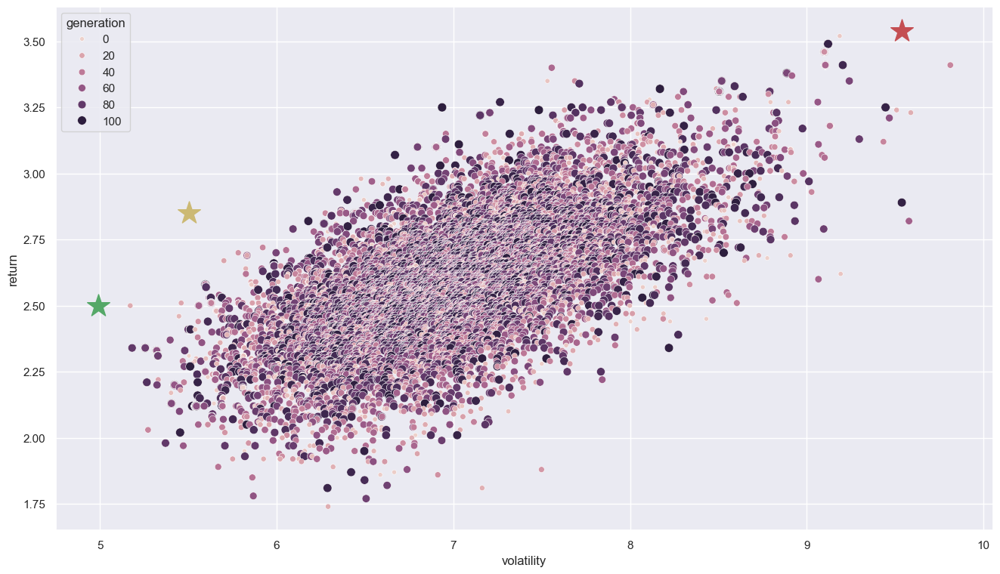

In [17]:
plt.figure(figsize=(16,9))
sns.scatterplot(x = results_df['volatility'],y = results_df['return'], size=results_df['generation'], hue=results_df['generation']) #, style=results_df['name'])
plt.scatter(x = b1['volatility'].iloc[0], y = b1['return'].iloc[0], marker = '*', color = 'r', s =500, label = 'Max E[Retorno]')
plt.scatter(x = b2['volatility'].iloc[0], y = b2['return'].iloc[0], marker = '*', color = 'g', s =500, label = 'Max E[Retorno]')
plt.scatter(x = b3['volatility'].iloc[0], y = b3['return'].iloc[0], marker = '*', color = 'y', s =500, label = 'Max E[Retorno]')

In [18]:
best_portfolios = pd.concat([b1,b2,b3])
best_portfolios

,name,generation,chromosome,return,volatility,sharpe_ratio
251,tree_3,5,1,3.54,9.537269,0.371175
1687,tree_2,33,37,2.50,4.989968,0.501005
1236,tree_1,24,36,2.85,5.504768,0.517733


In [19]:
w1 = tree1[best_portfolios['generation'].iloc[0]][best_portfolios['chromosome'].iloc[0]].get_weights()
w2 = tree1[best_portfolios['generation'].iloc[1]][best_portfolios['chromosome'].iloc[1]].get_weights()
w3 = tree1[best_portfolios['generation'].iloc[2]][best_portfolios['chromosome'].iloc[2]].get_weights()
d = {'stock_name': stock_names, 'Weights_Portafolio_retorno_maximo': w1, 'Weights_Portafolio_volatilidad_minima': w2, 'Weights_Portafolio_sharperatio_optimo': w3}
best_portfolios_weights = pd.DataFrame(data=d)
best_portfolios_weights

,stock_name,Weights_Portafolio_retorno_maximo,Weights_Portafolio_volatilidad_minima,Weights_Portafolio_sharperatio_optimo
0,AAPL,0.135107,0.096832,0.042625
1,TSLA,0.058168,0.142274,0.346680
2,DIS,0.067814,0.013784,0.010477
3,LLY,0.021571,0.019593,0.117757
4,NVDA,0.109229,0.175784,0.001297
5,MSFT,0.026734,0.293811,0.272472
6,META,0.156172,0.026240,0.065091
7,AMZN,0.134830,0.084186,0.011854
8,GOOGL,0.029818,0.009286,0.017012
9,JPM,0.107846,0.107047,0.030110


In [20]:
best_portfolios_weights['Weights_Portafolio_sharperatio_optimo']

0     0.042625
1     0.346680
2     0.010477
3     0.117757
4     0.001297
5     0.272472
6     0.065091
7     0.011854
8     0.017012
9     0.030110
10    0.084625
Name: Weights_Portafolio_sharperatio_optimo, dtype: float64

In [21]:
optimized_portfolio_maxShape = monthly_returns['aapl']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][0] \
           +monthly_returns['tsla']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][1] + monthly_returns['dis']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][2] \
           +monthly_returns['lly']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][3] + monthly_returns['nvda']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][4] \
           +monthly_returns['msft']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][5] + monthly_returns['meta']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][6] \
           +monthly_returns['amzn']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][7] + monthly_returns['googl']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][8] \
           +monthly_returns['jpm']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][9] + monthly_returns['costco']*best_portfolios_weights['Weights_Portafolio_sharperatio_optimo'][10] \
           
optimized_portfolio_maxShape # Visualizing daily returns

Date
2017-08-01          NaN
2017-09-01     4.602097
2017-10-01    -0.247777
2017-11-01     2.009495
2017-12-01     0.601319
                ...    
2024-03-01     8.222320
2024-04-01    -4.539692
2024-05-01    -1.508449
2024-06-01     4.001016
2024-07-01    11.963905
Length: 84, dtype: float64

In [22]:
# import quantstats as qs
# sp500 = qs.utils.download_returns('^GSPC')
# sp500 = sp500.loc[start_date:end_date]
# sp500_monthly_price = pd.merge(months, sp500, on='Date', how='left')
# sp500_monthly_returns = sp500_monthly_price.pct_change()*100
# sp500_monthly_returns = sp500_monthly_returns.drop(monthly_returns.index[0], axis=0)

In [23]:
# qs.reports.full(optimized_portfolio_maxShape, benchmark = sp500_monthly_returns)